In [1]:
# import pandas as pd
# import requests
# from bs4 import BeautifulSoup
# def Samsung_galaxy_customer_review(soup):
#     reviews=[]
#     review_blocks=soup.find_all("div",{"class":"_27M-vq"})
#     for block in review_blocks:
#         rating=block.find("div",{"class":"_3LWZlK"})
#         name=block.find_all("p",{"class":"_2sc7ZR"})[0]
#         date=block.find_all("p",{"class":"_2sc7ZR"})[1]
#         review=block.find("p",{"class":"_2-N8zT"})
#         review_desc=block.find("div",{"class":"t-ZTKy"})
#         if rating and name and date and review:
#             review_n={
#                 'Rating':rating.text,
#                 'Name':name.text.strip(),
#                 'Date':date.text.strip(),
#                 'Review':review.text,
#                 'Review Description':review_desc.text.strip()
#             }
#         reviews.append(review_n)
#     return reviews


# url="https://www.flipkart.com/samsung-galaxy-s21-fe-5g-snapdragon-888-olive-256-gb/product-reviews/itmb3a0b1e650a0e?pid=MOBGSXD7TZZTJQXE&lid=LSTMOBGSXD7TZZTJQXESJMZ8F&marketplace=FLIPKART"
# reviews=[]
# page=1
# while True:
#     page_url=url+"&page="+str(page)
#     r=requests.get(page_url)
#     soup=BeautifulSoup(r.content,"html.parser")
#     print(page,"page is scraping")
#     page_reviews=Samsung_galaxy_customer_review(soup)
#     #if not page_reviews:
#     if not page_reviews:
#         break
#     reviews.extend(page_reviews)
#     page+=1
# print(reviews)


In [2]:
#  from openpyxl import Workbook

In [3]:
# workbook=Workbook()
# sheet=workbook.active
# headers=['Rating','Review','Name','Date','Review_Description']
# sheet.append(headers)
# for review in reviews:
#     row_data=[review['Rating'],review['Review'],review['Name'],review['Date'],review['Review Description']]
#     sheet.append(row_data)
# workbook.save("NLP_WebScraping_Assignment.xlsx")

###NOTE: The above web scraping code may not run properly on google colab because of flipkart api documentation issues. That is why I have attached the excel file directly

###Also regarding the usage of positive and negative txt files the starting few lines have been removed for ease of coding. The same txt files are attached

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
import string
from matplotlib.pyplot import imread

In [5]:
 !python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 30.1 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [6]:
book=pd.read_excel("NLP_WebScraping_Assignment.xlsx")
book

,Rating,Review,Name,Date,Review_Description
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li..."
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...
...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter..."


In [7]:
book.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Rating              9990 non-null   int64 
 1   Review              9990 non-null   object
 2   Name                9990 non-null   object
 3   Date                9990 non-null   object
 4   Review_Description  9990 non-null   object
dtypes: int64(1), object(4)
memory usage: 390.4+ KB


In [8]:
book.shape

(9990, 5)

In [9]:
book.isna().any()

Rating                False
Review                False
Name                  False
Date                  False
Review_Description    False
dtype: bool

In [10]:
book.describe()

,Rating
count,9990.000000
mean,3.949550
std,1.386424
min,1.000000
25%,3.000000
50%,5.000000
75%,5.000000
max,5.000000


In [11]:
book['Date'].value_counts()

2 months ago     2913
7 months ago      908
1 month ago       906
4 months ago      738
5 months ago      726
Oct, 2022         467
6 months ago      442
9 months ago      420
11 months ago     357
10 months ago     316
3 months ago      315
8 months ago      294
Sep, 2022         253
Nov, 2022         109
Dec, 2022          98
18 days ago        41
15 days ago        36
12 days ago        36
8 days ago         36
9 days ago         35
17 days ago        33
13 days ago        31
3 days ago         29
1 day ago          29
14 days ago        29
11 days ago        28
10 days ago        28
16 days ago        26
Jan, 2023          26
7 days ago         26
6 days ago         23
4 days ago         20
29 days ago        20
28 days ago        19
2 days ago         19
5 days ago         19
30 days ago        17
19 days ago        14
22 days ago        13
23 days ago        11
24 days ago        11
25 days ago        10
Today               9
21 days ago         9
20 days ago         9
27 days ag

<Axes: xlabel='count', ylabel='Rating'>

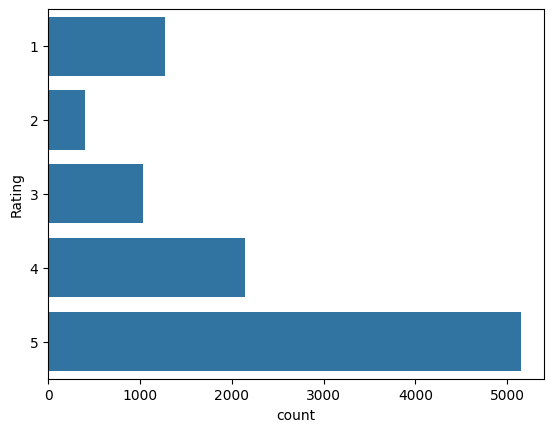

In [12]:
import seaborn as sns
sns.countplot(y='Rating',data=book)

In [13]:
print(book[["Review_Description"]])

                                     Review_Description
0     Reviewing after one month use Nice and handy p...
1     I personally buy this phone for camera it is g...
2     It is a great mobile, its camera is exactly li...
3     Using since last 10 days and super happy with ...
4     Awesome phone. Loved the camera . Display is A...
...                                                 ...
9985  Best phone in performance and camera. Battery ...
9986                                      NiceREAD MORE
9987  Battery drain fast and mobile heat upp during ...
9988  Excellent camera, sharp display, decent batter...
9989  Mobile is awesome camera is best but battery l...

[9990 rows x 1 columns]


In [14]:
book['Review_Description']=book['Review_Description'].str.replace('READ MORE$','',regex=True)

In [15]:
book

,Rating,Review,Name,Date,Review_Description
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li..."
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...
...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",Nice
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter..."


In [16]:
book1=[]
for row in book.Review_Description:
  book1.append(row)
book1

['Reviewing after one month use Nice and handy phone with 6.4 displayCompact size.Camera 📷 is mind blowing 🔥🔥Battery life is okDisplay is amazing with victous glass protection which is best in marketFor normal use its a best phone with amazing features and customisation',
 'I personally buy this phone for camera it is good but sometimes feeling need more optimisation and battery performance also good when we get refresh rate at standard it will go for long day 120 hz can drain ur battery easily and display is also very good sound was dolby atmos was very good soo finally experiencing flagship samsung mobile haptic feedback is also nice now slowly felling love with this mobile',
 'It is a great mobile, its camera is exactly like a flagship, can not get a better mobile in this range.',
 'Using since last 10 days and super happy with the purchase, also prompt delivery by flipkart,what an amazing camera,display and lovely one UI,received immediate android 13 one UI 5 update,overall happy a

In [17]:
book=book1

In [18]:
book

['Reviewing after one month use Nice and handy phone with 6.4 displayCompact size.Camera 📷 is mind blowing 🔥🔥Battery life is okDisplay is amazing with victous glass protection which is best in marketFor normal use its a best phone with amazing features and customisation',
 'I personally buy this phone for camera it is good but sometimes feeling need more optimisation and battery performance also good when we get refresh rate at standard it will go for long day 120 hz can drain ur battery easily and display is also very good sound was dolby atmos was very good soo finally experiencing flagship samsung mobile haptic feedback is also nice now slowly felling love with this mobile',
 'It is a great mobile, its camera is exactly like a flagship, can not get a better mobile in this range.',
 'Using since last 10 days and super happy with the purchase, also prompt delivery by flipkart,what an amazing camera,display and lovely one UI,received immediate android 13 one UI 5 update,overall happy a

In [19]:
book=[x.strip() for x in book]
book=[x for x in book if x]
book

['Reviewing after one month use Nice and handy phone with 6.4 displayCompact size.Camera 📷 is mind blowing 🔥🔥Battery life is okDisplay is amazing with victous glass protection which is best in marketFor normal use its a best phone with amazing features and customisation',
 'I personally buy this phone for camera it is good but sometimes feeling need more optimisation and battery performance also good when we get refresh rate at standard it will go for long day 120 hz can drain ur battery easily and display is also very good sound was dolby atmos was very good soo finally experiencing flagship samsung mobile haptic feedback is also nice now slowly felling love with this mobile',
 'It is a great mobile, its camera is exactly like a flagship, can not get a better mobile in this range.',
 'Using since last 10 days and super happy with the purchase, also prompt delivery by flipkart,what an amazing camera,display and lovely one UI,received immediate android 13 one UI 5 update,overall happy a

In [20]:
book=''.join(book)
book

'Reviewing after one month use Nice and handy phone with 6.4 displayCompact size.Camera 📷 is mind blowing 🔥🔥Battery life is okDisplay is amazing with victous glass protection which is best in marketFor normal use its a best phone with amazing features and customisationI personally buy this phone for camera it is good but sometimes feeling need more optimisation and battery performance also good when we get refresh rate at standard it will go for long day 120 hz can drain ur battery easily and display is also very good sound was dolby atmos was very good soo finally experiencing flagship samsung mobile haptic feedback is also nice now slowly felling love with this mobileIt is a great mobile, its camera is exactly like a flagship, can not get a better mobile in this range.Using since last 10 days and super happy with the purchase, also prompt delivery by flipkart,what an amazing camera,display and lovely one UI,received immediate android 13 one UI 5 update,overall happy and satisfied wit

In [21]:
no_punc_text=book.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Reviewing after one month use Nice and handy phone with 64 displayCompact sizeCamera 📷 is mind blowing 🔥🔥Battery life is okDisplay is amazing with victous glass protection which is best in marketFor normal use its a best phone with amazing features and customisationI personally buy this phone for camera it is good but sometimes feeling need more optimisation and battery performance also good when we get refresh rate at standard it will go for long day 120 hz can drain ur battery easily and display is also very good sound was dolby atmos was very good soo finally experiencing flagship samsung mobile haptic feedback is also nice now slowly felling love with this mobileIt is a great mobile its camera is exactly like a flagship can not get a better mobile in this rangeUsing since last 10 days and super happy with the purchase also prompt delivery by flipkartwhat an amazing cameradisplay and lovely one UIreceived immediate android 13 one UI 5 updateoverall happy and satisfied with my purch

In [22]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
token_text=word_tokenize(book)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [23]:
print(token_text)

['Reviewing', 'after', 'one', 'month', 'use', 'Nice', 'and', 'handy', 'phone', 'with', '6.4', 'displayCompact', 'size.Camera', '📷', 'is', 'mind', 'blowing', '🔥🔥Battery', 'life', 'is', 'okDisplay', 'is', 'amazing', 'with', 'victous', 'glass', 'protection', 'which', 'is', 'best', 'in', 'marketFor', 'normal', 'use', 'its', 'a', 'best', 'phone', 'with', 'amazing', 'features', 'and', 'customisationI', 'personally', 'buy', 'this', 'phone', 'for', 'camera', 'it', 'is', 'good', 'but', 'sometimes', 'feeling', 'need', 'more', 'optimisation', 'and', 'battery', 'performance', 'also', 'good', 'when', 'we', 'get', 'refresh', 'rate', 'at', 'standard', 'it', 'will', 'go', 'for', 'long', 'day', '120', 'hz', 'can', 'drain', 'ur', 'battery', 'easily', 'and', 'display', 'is', 'also', 'very', 'good', 'sound', 'was', 'dolby', 'atmos', 'was', 'very', 'good', 'soo', 'finally', 'experiencing', 'flagship', 'samsung', 'mobile', 'haptic', 'feedback', 'is', 'also', 'nice', 'now', 'slowly', 'felling', 'love', 'with

In [24]:
len(token_text)

163771

In [25]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')


In [26]:
no_stop_words=[word for word in token_text if word not in my_stop_words]
print(no_stop_words)

['Reviewing', 'one', 'month', 'use', 'Nice', 'handy', 'phone', '6.4', 'displayCompact', 'size.Camera', '📷', 'mind', 'blowing', '🔥🔥Battery', 'life', 'okDisplay', 'amazing', 'victous', 'glass', 'protection', 'best', 'marketFor', 'normal', 'use', 'best', 'phone', 'amazing', 'features', 'customisationI', 'personally', 'buy', 'phone', 'camera', 'good', 'sometimes', 'feeling', 'need', 'optimisation', 'battery', 'performance', 'also', 'good', 'get', 'refresh', 'rate', 'standard', 'go', 'long', 'day', '120', 'hz', 'drain', 'ur', 'battery', 'easily', 'display', 'also', 'good', 'sound', 'dolby', 'atmos', 'good', 'soo', 'finally', 'experiencing', 'flagship', 'samsung', 'mobile', 'haptic', 'feedback', 'also', 'nice', 'slowly', 'felling', 'love', 'mobileIt', 'great', 'mobile', ',', 'camera', 'exactly', 'like', 'flagship', ',', 'get', 'better', 'mobile', 'range.Using', 'since', 'last', '10', 'days', 'super', 'happy', 'purchase', ',', 'also', 'prompt', 'delivery', 'flipkart', ',', 'amazing', 'camera'

In [27]:
len(no_stop_words)

112625

In [28]:
lower_words=[Text.lower() for Text in no_stop_words]
print(lower_words)

['reviewing', 'one', 'month', 'use', 'nice', 'handy', 'phone', '6.4', 'displaycompact', 'size.camera', '📷', 'mind', 'blowing', '🔥🔥battery', 'life', 'okdisplay', 'amazing', 'victous', 'glass', 'protection', 'best', 'marketfor', 'normal', 'use', 'best', 'phone', 'amazing', 'features', 'customisationi', 'personally', 'buy', 'phone', 'camera', 'good', 'sometimes', 'feeling', 'need', 'optimisation', 'battery', 'performance', 'also', 'good', 'get', 'refresh', 'rate', 'standard', 'go', 'long', 'day', '120', 'hz', 'drain', 'ur', 'battery', 'easily', 'display', 'also', 'good', 'sound', 'dolby', 'atmos', 'good', 'soo', 'finally', 'experiencing', 'flagship', 'samsung', 'mobile', 'haptic', 'feedback', 'also', 'nice', 'slowly', 'felling', 'love', 'mobileit', 'great', 'mobile', ',', 'camera', 'exactly', 'like', 'flagship', ',', 'get', 'better', 'mobile', 'range.using', 'since', 'last', '10', 'days', 'super', 'happy', 'purchase', ',', 'also', 'prompt', 'delivery', 'flipkart', ',', 'amazing', 'camera'

In [29]:
from nltk.stem import PorterStemmer
stem=PorterStemmer()
stemmed_words=[stem.stem(word) for word in lower_words]

In [30]:
print(stemmed_words)

['review', 'one', 'month', 'use', 'nice', 'handi', 'phone', '6.4', 'displaycompact', 'size.camera', '📷', 'mind', 'blow', '🔥🔥batteri', 'life', 'okdisplay', 'amaz', 'victou', 'glass', 'protect', 'best', 'marketfor', 'normal', 'use', 'best', 'phone', 'amaz', 'featur', 'customisationi', 'person', 'buy', 'phone', 'camera', 'good', 'sometim', 'feel', 'need', 'optimis', 'batteri', 'perform', 'also', 'good', 'get', 'refresh', 'rate', 'standard', 'go', 'long', 'day', '120', 'hz', 'drain', 'ur', 'batteri', 'easili', 'display', 'also', 'good', 'sound', 'dolbi', 'atmo', 'good', 'soo', 'final', 'experienc', 'flagship', 'samsung', 'mobil', 'haptic', 'feedback', 'also', 'nice', 'slowli', 'fell', 'love', 'mobileit', 'great', 'mobil', ',', 'camera', 'exactli', 'like', 'flagship', ',', 'get', 'better', 'mobil', 'range.us', 'sinc', 'last', '10', 'day', 'super', 'happi', 'purchas', ',', 'also', 'prompt', 'deliveri', 'flipkart', ',', 'amaz', 'camera', ',', 'display', 'love', 'one', 'ui', ',', 'receiv', 'im

In [31]:
import spacy
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

reviewing one month use nice handy phone 6.4 displaycompact size.camera 📷 mind blowing 🔥🔥battery life okdisplay amazing victous glass protection best marketfor normal use best phone amazing features customisationi personally buy phone camera good sometimes feeling need optimisation battery performance also good get refresh rate standard go long day 120 hz drain ur battery easily display also good sound dolby atmos good soo finally experiencing flagship samsung mobile haptic feedback also nice slowly felling love mobileit great mobile , camera exactly like flagship , get better mobile range.using since last 10 days super happy purchase , also prompt delivery flipkart , amazing camera , display lovely one ui , received immediate android 13 one ui 5 update , overall happy satisfied purchase.awesome phone . loved camera . display awesome beautiful . buy without hesitatingbest camera.super display . ip 68 rating.3 yrs android updates.a good rounder mobile.but missing fast charging compare m

In [32]:
lemmas=[tokens.lemma_ for tokens in doc]
print(lemmas)


['review', 'one', 'month', 'use', 'nice', 'handy', 'phone', '6.4', 'displaycompact', 'size.camera', '📷', 'mind', 'blow', '🔥', '🔥', 'battery', 'life', 'okdisplay', 'amazing', 'victous', 'glass', 'protection', 'well', 'marketfor', 'normal', 'use', 'good', 'phone', 'amazing', 'feature', 'customisationi', 'personally', 'buy', 'phone', 'camera', 'good', 'sometimes', 'feel', 'need', 'optimisation', 'battery', 'performance', 'also', 'good', 'get', 'refresh', 'rate', 'standard', 'go', 'long', 'day', '120', 'hz', 'drain', 'ur', 'battery', 'easily', 'display', 'also', 'good', 'sound', 'dolby', 'atmos', 'good', 'soo', 'finally', 'experience', 'flagship', 'samsung', 'mobile', 'haptic', 'feedback', 'also', 'nice', 'slowly', 'fell', 'love', 'mobileit', 'great', 'mobile', ',', 'camera', 'exactly', 'like', 'flagship', ',', 'get', 'well', 'mobile', 'range.using', 'since', 'last', '10', 'day', 'super', 'happy', 'purchase', ',', 'also', 'prompt', 'delivery', 'flipkart', ',', 'amazing', 'camera', ',', 'di

In [33]:
clean_tokens=' '.join(lemmas)

In [34]:
print(clean_tokens)

review one month use nice handy phone 6.4 displaycompact size.camera 📷 mind blow 🔥 🔥 battery life okdisplay amazing victous glass protection well marketfor normal use good phone amazing feature customisationi personally buy phone camera good sometimes feel need optimisation battery performance also good get refresh rate standard go long day 120 hz drain ur battery easily display also good sound dolby atmos good soo finally experience flagship samsung mobile haptic feedback also nice slowly fell love mobileit great mobile , camera exactly like flagship , get well mobile range.using since last 10 day super happy purchase , also prompt delivery flipkart , amazing camera , display lovely one ui , receive immediate android 13 one ui 5 update , overall happy satisfied purchase.awesome phone . love camera . display awesome beautiful . buy without hesitatingbest camera.super display . ip 68 rating.3 yrs android updates.a good rounder mobile.but miss fast charge compare mobile price segment . i

In [35]:
from sklearn.feature_extraction.text import CountVectorizer
c=CountVectorizer()
X=c.fit_transform(lemmas)

In [36]:
X

<116170x9742 sparse matrix of type '<class 'numpy.int64'>'
	with 97783 stored elements in Compressed Sparse Row format>

In [37]:
import pandas as pd
pd.DataFrame.from_records([c.vocabulary_]).T.sort_values(0,ascending=False).head(20)

,0
zooming,9741
zoomgood,9740
zoombest,9739
zoombattery,9738
zoomb,9737
zoomat,9736
zoom,9735
zoo,9734
zomme,9733
zeroit,9732


In [38]:
print(c.vocabulary_)

{'review': 7712, 'one': 6078, 'month': 5664, 'use': 9149, 'nice': 5796, 'handy': 4175, 'phone': 6523, 'displaycompact': 2742, 'size': 8164, 'camera': 1819, 'mind': 5427, 'blow': 1563, 'battery': 1317, 'life': 5066, 'okdisplay': 6015, 'amazing': 843, 'victous': 9334, 'glass': 3867, 'protection': 7328, 'well': 9471, 'marketfor': 5320, 'normal': 5889, 'good': 3888, 'feature': 3495, 'customisationi': 2397, 'personally': 6506, 'buy': 1739, 'sometimes': 8295, 'feel': 3529, 'need': 5770, 'optimisation': 6161, 'performance': 6414, 'also': 814, 'get': 3846, 'refresh': 7610, 'rate': 7524, 'standard': 8385, 'go': 3878, 'long': 5149, 'day': 2433, '120': 77, 'hz': 4457, 'drain': 2847, 'ur': 9104, 'easily': 2942, 'display': 2726, 'sound': 8323, 'dolby': 2804, 'atmos': 1001, 'soo': 8304, 'finally': 3572, 'experience': 3247, 'flagship': 3599, 'samsung': 7846, 'mobile': 5480, 'haptic': 4195, 'feedback': 3527, 'slowly': 8199, 'fell': 3542, 'love': 5186, 'mobileit': 5516, 'great': 4092, 'exactly': 3123, 

In [39]:
print(c.get_feature_names_out()[50:100])

['10overal' '10overall' '10performance' '10product' '10r' '10recommended'
 '10samsung' '10screen' '10sound' '10th' '10the' '10this' '10ui' '10user'
 '10using' '10very' '10w' '10x' '10yes' '10you' '11' '11days' '11hrs'
 '11i' '11r' '11x' '12' '120' '1200nit' '120h' '120hz' '120hzcamera'
 '120hzgood' '120wt' '122' '1250' '128' '12am' '12hr' '12hrs' '12hrs1'
 '12k' '12mini' '12months' '12mp' '12mpi' '12nice' '12th' '13' '1300']


In [40]:
print(X.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [41]:

print(X.toarray().shape)

(116170, 9742)


In [42]:
vectorizer_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=vectorizer_ngram_range.fit_transform(lemmas)

In [43]:
print(vectorizer_ngram_range.get_feature_names_out())

['10' '30k' 'also' 'amazing' 'and' 'average' 'awesome' 'back' 'backup'
 'bad' 'battery' 'be' 'bit' 'but' 'buy' 'camera' 'charge' 'day' 'design'
 'device' 'display' 'do' 'drain' 'even' 'everything' 'excellent' 'except'
 'experience' 'fast' 'fe' 'feature' 'feel' 'flagship' 'flipkart' 'gaming'
 'get' 'give' 'go' 'good' 'great' 'heat' 'heating' 'heavy' 'hour' 'if'
 'issue' 'it' 'last' 'life' 'light' 'like' 'little' 'look' 'love' 'low'
 'mobile' 'money' 'month' 'much' 'need' 'network' 'nice' 'normal' 'not'
 'ok' 'one' 'overall' 'performance' 'phone' 'poor' 'premium' 'price'
 'problem' 'processor' 'product' 'purchase' 'quality' 'range' 'really'
 'review' 's21' 'samsung' 'screen' 'super' 'superb' 'take' 'the' 'thing'
 'this' 'time' 'ui' 'update' 'usage' 'use' 'user' 'value' 'very' 'video'
 'well' 'work']


In [44]:
print(bow_matrix_ngram.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [45]:
print(bow_matrix_ngram.toarray().shape)

(116170, 100)


In [46]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf_idf_ngram_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tf_idf_ngram_matrix=tf_idf_ngram_features.fit_transform(lemmas)

In [47]:
print(tf_idf_ngram_matrix.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [48]:
print(tf_idf_ngram_features.get_feature_names_out())

['10' '100' '12' '120' '120hz' '13' '15' '20' '2023' '2100' '25' '256'
 '25w' '30' '30k' '30x' '32k' '35k' '3x' '40k' '4500' '4k' '5battery'
 '5display' '5performance' '60' '60hz' '888' 'able' 'absolutely' 'accord'
 'after' 'all' 'almost' 'also' 'although' 'always' 'amaze' 'amazing'
 'amole' 'and' 'android' 'another' 'anyone' 'anything' 'apart' 'app'
 'around' 'as' 'aspect' 'at' 'available' 'average' 'awesome' 'back'
 'backup' 'bad' 'batter' 'battery' 'bbd' 'be' 'beast' 'beat' 'beautiful'
 'become' 'best' 'better' 'bettery' 'big' 'billion' 'bit' 'blow' 'body'
 'box' 'brand' 'brightness' 'brilliant' 'budget' 'build' 'but' 'buy'
 'buying' 'call' 'cam' 'camara' 'camera' 'can' 'capacity' 'capture' 'case'
 'casual' 'change' 'charge' 'charger' 'charging' 'cheap' 'chinese'
 'choice' 'class' 'clear' 'click' 'color' 'colour' 'come' 'compact'
 'compare' 'completely' 'con' 'concern' 'condition' 'connect'
 'connectivity' 'consider' 'continuously' 'cool' 'cost' 'could' 'cover'
 'customer' 'daily' '

In [49]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud,STOPWORDS
def plot_cloud(wordcloud):
  plt.figure(figsize=(40,40))
  plt.imshow(wordcloud)
  plt.axis('off')

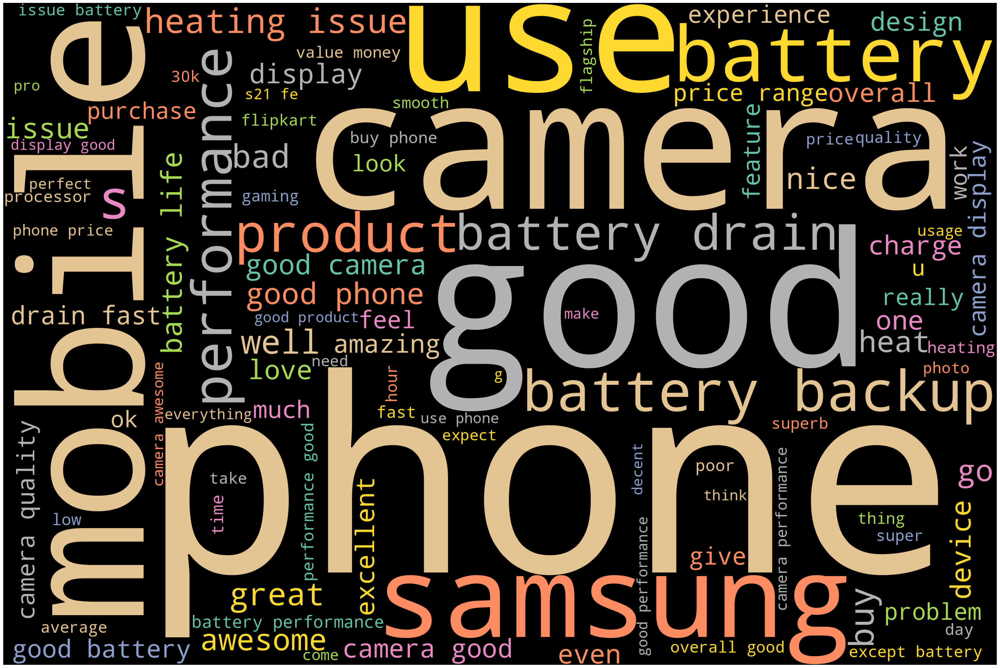

In [50]:
stopwords=STOPWORDS
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=100,colormap='Set2',stopwords=STOPWORDS).generate(clean_tokens)
plot_cloud(wordcloud)

In [51]:
nlp=spacy.load('en_core_web_sm')
doc_block=nlp(clean_tokens)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [52]:
for token in doc_block[10:30]:
  print(token,token.pos_)

📷 NOUN
mind NOUN
blow NOUN
🔥 NOUN
🔥 VERB
battery NOUN
life NOUN
okdisplay VERB
amazing ADJ
victous ADJ
glass NOUN
protection NOUN
well INTJ
marketfor ADP
normal ADJ
use NOUN
good ADJ
phone NOUN
amazing ADJ
feature NOUN


In [53]:
noun_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(noun_verbs[0:200])

['review', 'month', 'use', 'phone', 'displaycompact', '📷', 'mind', 'blow', '🔥', '🔥', 'battery', 'life', 'okdisplay', 'glass', 'protection', 'use', 'phone', 'feature', 'buy', 'phone', 'camera', 'good', 'feel', 'need', 'optimisation', 'battery', 'performance', 'get', 'rate', 'standard', 'go', 'day', 'hz', 'drain', 'battery', 'display', 'sound', 'experience', 'feedback', 'fell', 'love', 'mobile', 'camera', 'flagship', 'get', 'range.using', 'day', 'purchase', 'delivery', 'flipkart', 'camera', 'display', 'ui', 'receive', 'ui', 'update', 'purchase.awesome', 'phone', 'display', 'buy', 'hesitatingbest', 'display', 'ip', 'android', 'rounder', 'miss', 'charge', 'compare', 'price', 'segment', 'camera', 'performance', 'mind', 'blow', 'purchase.amaze', 'camera', 'display', 'ui', 'battery', 'performance.mind', 'blow', 'camerabest', 'shot', 'come', 'daylight', 'conditionoverall', 'phone', 'price', 'rangecons.poor', 'battery', 'backup', 'need', 'recharge', 'device', 'dayvery', 'look', 'camera', 'perfo

In [54]:
with open("/content/positive-words.txt",'r') as p:
  positive=p.read()
print(positive)

a+
abound
abounds
abundance
abundant
accessable
accessible
acclaim
acclaimed
acclamation
accolade
accolades
accommodative
accomodative
accomplish
accomplished
accomplishment
accomplishments
accurate
accurately
achievable
achievement
achievements
achievible
acumen
adaptable
adaptive
adequate
adjustable
admirable
admirably
admiration
admire
admirer
admiring
admiringly
adorable
adore
adored
adorer
adoring
adoringly
adroit
adroitly
adulate
adulation
adulatory
advanced
advantage
advantageous
advantageously
advantages
adventuresome
adventurous
advocate
advocated
advocates
affability
affable
affably
affectation
affection
affectionate
affinity
affirm
affirmation
affirmative
affluence
affluent
afford
affordable
affordably
afordable
agile
agilely
agility
agreeable
agreeableness
agreeably
all-around
alluring
alluringly
altruistic
altruistically
amaze
amazed
amazement
amazes
amazing
amazingly
ambitious
ambitiously
ameliorate
amenable
amenity
amiability
amiabily
amiable
amicability
amicable
amicabl

In [55]:
with open("/content/negative-words.txt",'r',encoding='latin-1') as n:
  negative=n.read()
print(negative)

2-faced
2-faces
abnormal
abolish
abominable
abominably
abominate
abomination
abort
aborted
aborts
abrade
abrasive
abrupt
abruptly
abscond
absence
absent-minded
absentee
absurd
absurdity
absurdly
absurdness
abuse
abused
abuses
abusive
abysmal
abysmally
abyss
accidental
accost
accursed
accusation
accusations
accuse
accuses
accusing
accusingly
acerbate
acerbic
acerbically
ache
ached
aches
achey
aching
acrid
acridly
acridness
acrimonious
acrimoniously
acrimony
adamant
adamantly
addict
addicted
addicting
addicts
admonish
admonisher
admonishingly
admonishment
admonition
adulterate
adulterated
adulteration
adulterier
adversarial
adversary
adverse
adversity
afflict
affliction
afflictive
affront
afraid
aggravate
aggravating
aggravation
aggression
aggressive
aggressiveness
aggressor
aggrieve
aggrieved
aggrivation
aghast
agonies
agonize
agonizing
agonizingly
agony
aground
ail
ailing
ailment
aimless
alarm
alarmed
alarming
alarmingly
alienate
alienated
alienation
allegation
allegations
allege
aller

In [56]:
sentiment=pd.read_excel("/content/NLP_WebScraping_Assignment.xlsx")
sentiment

,Rating,Review,Name,Date,Review_Description
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li..."
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...
...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter..."


In [57]:
sentiment['Positive']=0

In [58]:
sentiment['Negative']=0

In [59]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,0,0
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,0,0
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",0,0
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,0,0
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0
...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,0,0
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",0,0


In [60]:
positive=[]
with open("/content/positive-words.txt",'r') as p:
  for line in p:
    positive.append(line.strip())
print(positive)

['a+', 'abound', 'abounds', 'abundance', 'abundant', 'accessable', 'accessible', 'acclaim', 'acclaimed', 'acclamation', 'accolade', 'accolades', 'accommodative', 'accomodative', 'accomplish', 'accomplished', 'accomplishment', 'accomplishments', 'accurate', 'accurately', 'achievable', 'achievement', 'achievements', 'achievible', 'acumen', 'adaptable', 'adaptive', 'adequate', 'adjustable', 'admirable', 'admirably', 'admiration', 'admire', 'admirer', 'admiring', 'admiringly', 'adorable', 'adore', 'adored', 'adorer', 'adoring', 'adoringly', 'adroit', 'adroitly', 'adulate', 'adulation', 'adulatory', 'advanced', 'advantage', 'advantageous', 'advantageously', 'advantages', 'adventuresome', 'adventurous', 'advocate', 'advocated', 'advocates', 'affability', 'affable', 'affably', 'affectation', 'affection', 'affectionate', 'affinity', 'affirm', 'affirmation', 'affirmative', 'affluence', 'affluent', 'afford', 'affordable', 'affordably', 'afordable', 'agile', 'agilely', 'agility', 'agreeable', 'ag

In [61]:
negative=[]
with open("/content/negative-words.txt",'r',encoding='latin-1') as n:
  for line in n:
    negative.append(line.strip())
print(negative)

['2-faced', '2-faces', 'abnormal', 'abolish', 'abominable', 'abominably', 'abominate', 'abomination', 'abort', 'aborted', 'aborts', 'abrade', 'abrasive', 'abrupt', 'abruptly', 'abscond', 'absence', 'absent-minded', 'absentee', 'absurd', 'absurdity', 'absurdly', 'absurdness', 'abuse', 'abused', 'abuses', 'abusive', 'abysmal', 'abysmally', 'abyss', 'accidental', 'accost', 'accursed', 'accusation', 'accusations', 'accuse', 'accuses', 'accusing', 'accusingly', 'acerbate', 'acerbic', 'acerbically', 'ache', 'ached', 'aches', 'achey', 'aching', 'acrid', 'acridly', 'acridness', 'acrimonious', 'acrimoniously', 'acrimony', 'adamant', 'adamantly', 'addict', 'addicted', 'addicting', 'addicts', 'admonish', 'admonisher', 'admonishingly', 'admonishment', 'admonition', 'adulterate', 'adulterated', 'adulteration', 'adulterier', 'adversarial', 'adversary', 'adverse', 'adversity', 'afflict', 'affliction', 'afflictive', 'affront', 'afraid', 'aggravate', 'aggravating', 'aggravation', 'aggression', 'aggress

In [62]:
for index,review in enumerate(sentiment['Review_Description']):
  positive_count=0
  negative_count=0
  words=review.split()
  for word in words:
    if word in positive:
      positive_count+=1
    if word in negative:
      negative_count+=1
  sentiment.at[index,'Positive']=positive_count
  sentiment.at[index,'Negative']=negative_count

In [63]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,6,0
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,7,2
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",3,0
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,7,0
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0
...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,1,1
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",2,0


In [64]:
sentiment['Positive'] = 0
sentiment['Negative'] = 0

for index, review in enumerate(sentiment['Review_Description']):
    positive_count = 0
    negative_count = 0
    words = review.split()
    for word in words:
        if word in positive:
            positive_count += 1
        if word in negative:
            negative_count += 1
    sentiment.at[index, 'Positive'] = positive_count
    sentiment.at[index, 'Negative'] = negative_count


In [65]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,6,0
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,7,2
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",3,0
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,7,0
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0
...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,1,1
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",2,0


In [66]:
sentiment['Word_count']=0
for index,review in enumerate(sentiment['Review_Description']):
  wc=0
  words=review.split()
  wc=len(words)
  sentiment.at[index,'Word_count']=wc

In [67]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative,Word_count
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,6,0,44
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,7,2,73
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",3,0,22
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,7,0,37
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0,16
...,...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0,15
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0,2
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,1,1,15
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",2,0,14


In [68]:
sentiment['Polarity']=0
for index,review in enumerate(sentiment['Review_Description']):
  positive=sentiment.at[index,'Positive']
  negative=sentiment.at[index,'Negative']
  wc=sentiment.at[index,'Word_count']
  if wc>0:
    p=(positive-negative)/wc
  else:
    p=0
  sentiment.at[index,'Polarity']=p

In [69]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative,Word_count,Polarity
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,6,0,44,0.136364
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,7,2,73,0.068493
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",3,0,22,0.136364
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,7,0,37,0.189189
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0,16,0.000000
...,...,...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0,15,0.000000
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0,2,0.000000
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,1,1,15,0.000000
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",2,0,14,0.142857


In [70]:
sentiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rating              9990 non-null   int64  
 1   Review              9990 non-null   object 
 2   Name                9990 non-null   object 
 3   Date                9990 non-null   object 
 4   Review_Description  9990 non-null   object 
 5   Positive            9990 non-null   int64  
 6   Negative            9990 non-null   int64  
 7   Word_count          9990 non-null   int64  
 8   Polarity            9990 non-null   float64
dtypes: float64(1), int64(4), object(4)
memory usage: 702.5+ KB


In [71]:
sentiment.columns

Index(['Rating', 'Review', 'Name', 'Date', 'Review_Description', 'Positive',
       'Negative', 'Word_count', 'Polarity'],
      dtype='object')

Text(0.5, 1.0, 'DISTRIBUTION OF POLARITY')

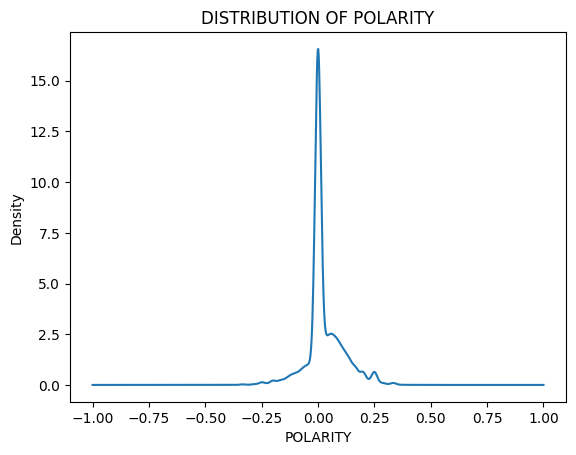

In [72]:
sentiment['Polarity'].plot(kind='kde')
plt.xlabel("POLARITY")
plt.title("DISTRIBUTION OF POLARITY")

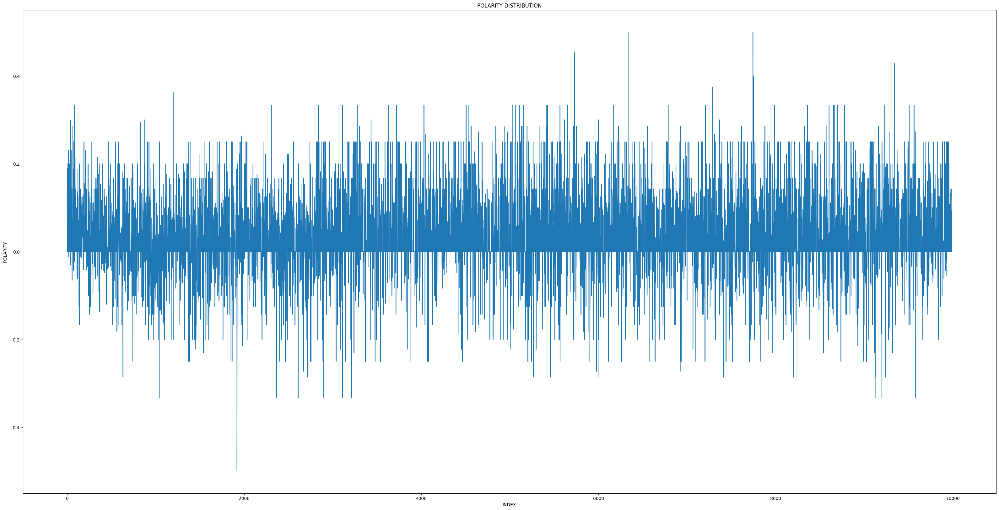

In [73]:
x=sentiment.index
y=sentiment.Polarity
plt.figure(figsize=(40,20))
plt.plot(x,y)
plt.xlabel("INDEX")
plt.ylabel("POLARITY")
plt.title("POLARITY DISTRIBUTION")
plt.show()

In [74]:
sentiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rating              9990 non-null   int64  
 1   Review              9990 non-null   object 
 2   Name                9990 non-null   object 
 3   Date                9990 non-null   object 
 4   Review_Description  9990 non-null   object 
 5   Positive            9990 non-null   int64  
 6   Negative            9990 non-null   int64  
 7   Word_count          9990 non-null   int64  
 8   Polarity            9990 non-null   float64
dtypes: float64(1), int64(4), object(4)
memory usage: 702.5+ KB


In [75]:
sentiment['Status']=""
for index,review in enumerate(sentiment['Review_Description']):
  if sentiment.at[index,'Polarity']>0:
    sentiment.at[index,'Status']="Positive"
  elif sentiment.at[index,'Polarity']<0:
    sentiment.at[index,'Status']="Negative"
  else:
    sentiment.at[index,'Status']="Neutral"

In [76]:
sentiment

,Rating,Review,Name,Date,Review_Description,Positive,Negative,Word_count,Polarity,Status
0,5,Great product,Udit Joshi,"Oct, 2022",Reviewing after one month use Nice and handy p...,6,0,44,0.136364,Positive
1,5,Excellent,Srinu Karnati,"Sep, 2022",I personally buy this phone for camera it is g...,7,2,73,0.068493,Positive
2,5,Must buy!,Sandeep Rai,"Oct, 2022","It is a great mobile, its camera is exactly li...",3,0,22,0.136364,Positive
3,5,Awesome,Flipkart Customer,"Dec, 2022",Using since last 10 days and super happy with ...,7,0,37,0.189189,Positive
4,5,Awesome,Debarghya Pati,"Oct, 2022",Awesome phone. Loved the camera . Display is A...,0,0,16,0.000000,Neutral
...,...,...,...,...,...,...,...,...,...,...
9985,5,Fabulous!,Kishan Patel,"Dec, 2022",Best phone in performance and camera. Battery ...,0,0,15,0.000000,Neutral
9986,4,Really Nice,Flipkart Customer,"Dec, 2022",NiceREAD MORE,0,0,2,0.000000,Neutral
9987,3,Just okay,Mantu Kumar,"Dec, 2022",Battery drain fast and mobile heat upp during ...,1,1,15,0.000000,Neutral
9988,5,Excellent,RajendraPrasad R,"Dec, 2022","Excellent camera, sharp display, decent batter...",2,0,14,0.142857,Positive


In [77]:
sentiment.Status.value_counts()

Neutral     5206
Positive    3589
Negative    1195
Name: Status, dtype: int64

<Axes: xlabel='Status', ylabel='count'>

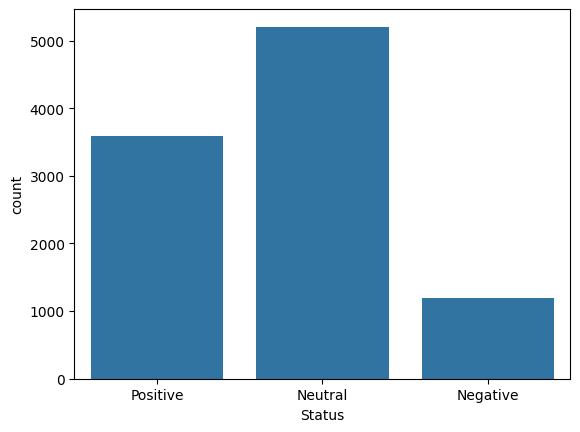

In [78]:
sns.countplot(x='Status',data=sentiment)

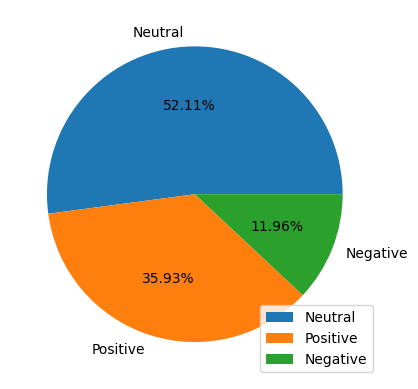

In [80]:
plt.pie(sentiment['Status'].value_counts(),autopct='%1.2f%%',labels=sentiment['Status'].value_counts().index)
plt.legend(loc='best')
plt.show()